In [1]:
import sys
import os
import json
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.models as models
import numpy as np
import cv2
import matplotlib.pyplot as plt

from pathlib import Path
# Add the parent directory to the Python path
sys.path.append(str(Path().resolve().parent))
import utils
import trainer
import evaluator
import data_process
import motion_blur

# Set random seed for reproducibility
seed = 211
np.random.seed(seed)
torch.manual_seed(seed)

In [2]:
input_size = 320

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((input_size, input_size)),
    torchvision.transforms.ToTensor(), # uint8 values in [0, 255] -> float tensor with values [0, 1]
    torchvision.transforms.Normalize(mean=data_process.train_mean.tolist(), std=data_process.train_std.tolist())
])

train_set, val_set, test_set = data_process.load_data(transform=transform, input_size=input_size, img_dir=os.path.join('..', data_process.img_dir), ann_dir=os.path.join('..', data_process.ann_dir))   

test_set_uni_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.01})
test_set_uni_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.05})
test_set_uni_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.1})
test_set_elli_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.01})
test_set_elli_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.05})
test_set_elli_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.1})
test_set_nat = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'natural', 'kernel_path': '../data/motion_blur_data'})

Data already exists

Number of valid images: 664
Train set size: 464 - 69.88%
Validation set size: 67 - 10.09%
Test set size: 133 - 20.03%



In [3]:
# Train with data augmentation:
history = trainer.train_from_config(model_config_path="../data/models/ssdlite320_mobilenet_v3_large/ssdlite320_mobilenet_v3_large_best_params.json", train_set=train_set, val_set=val_set, save_path="../data/models/ssdlite320_mobilenet_v3_large/", kornia_aug=False)

Starting training for ssdlite320_mobilenet_v3_large with the following parameters:
{'batch_size': 8, 'epochs': 100, 'preweight_mode': 'fine_tuning', 'optimizer': 'Adam', 'lr': 0.000721282926313481, 'beta1': 0.9073359186756311, 'beta2': 0.9910589483762591, 'scheduler': 'CosineAnnealingLR', 'T_max': 6, 'eta_min': 1.4508027487967911e-06}
Epoch 1/100, Train Loss: 222.9168, Val mAP@50: 0.4098, FPS: 422.45, Epoch Time: 5.17 seconds
Epoch 2/100, Train Loss: 144.6681, Val mAP@50: 0.4046, FPS: 571.08, Epoch Time: 4.77 seconds
Epoch 3/100, Train Loss: 106.2568, Val mAP@50: 0.3835, FPS: 526.98, Epoch Time: 4.72 seconds
Epoch 4/100, Train Loss: 83.4962, Val mAP@50: 0.4393, FPS: 597.71, Epoch Time: 4.65 seconds
Epoch 5/100, Train Loss: 64.7856, Val mAP@50: 0.4498, FPS: 584.75, Epoch Time: 4.65 seconds
Epoch 6/100, Train Loss: 56.6465, Val mAP@50: 0.4516, FPS: 602.24, Epoch Time: 4.58 seconds
Epoch 7/100, Train Loss: 53.3746, Val mAP@50: 0.4511, FPS: 566.96, Epoch Time: 4.61 seconds
Epoch 8/100, Tra

Mean Average Precision @ 0.5 : 0.4090 FPS: 387.13


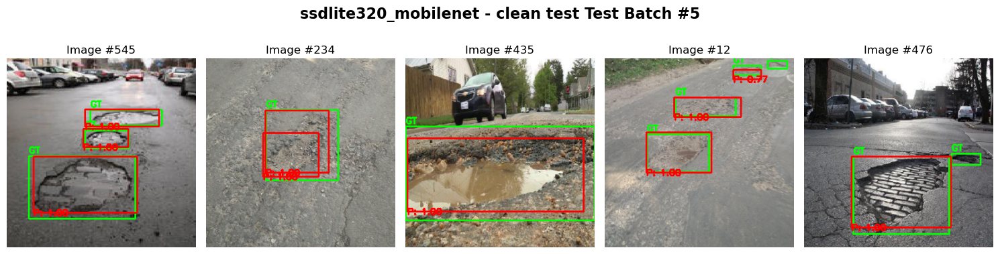

Mean Average Precision @ 0.5 : 0.3747 FPS: 416.37


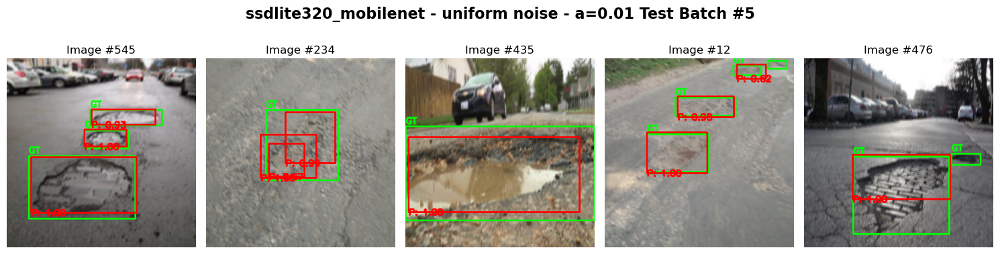

Mean Average Precision @ 0.5 : 0.1305 FPS: 440.43


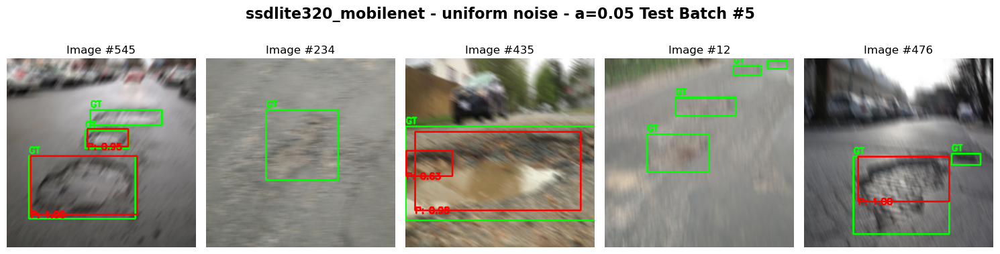

Mean Average Precision @ 0.5 : 0.0226 FPS: 422.62


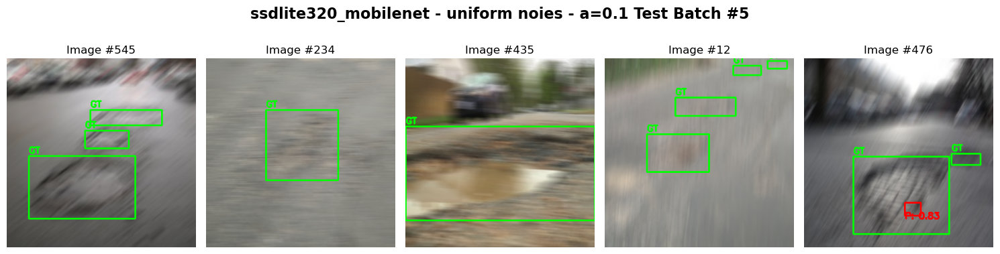

Mean Average Precision @ 0.5 : 0.3592 FPS: 443.54


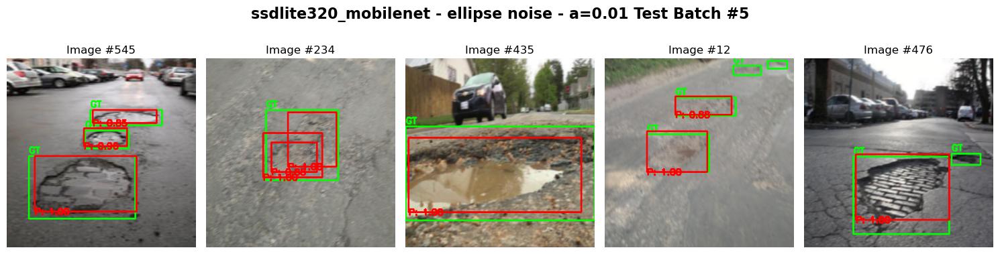

Mean Average Precision @ 0.5 : 0.1671 FPS: 439.59


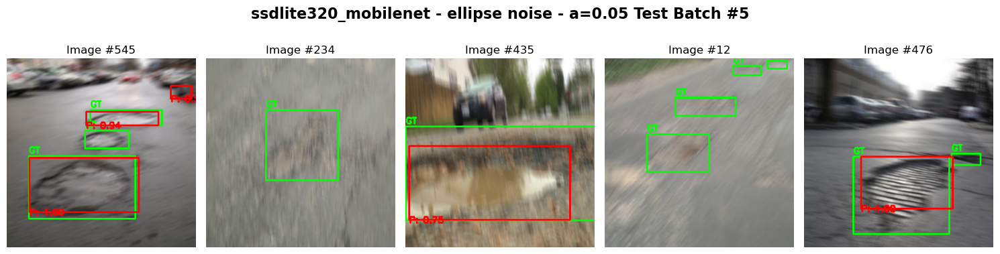

Mean Average Precision @ 0.5 : 0.0375 FPS: 449.45


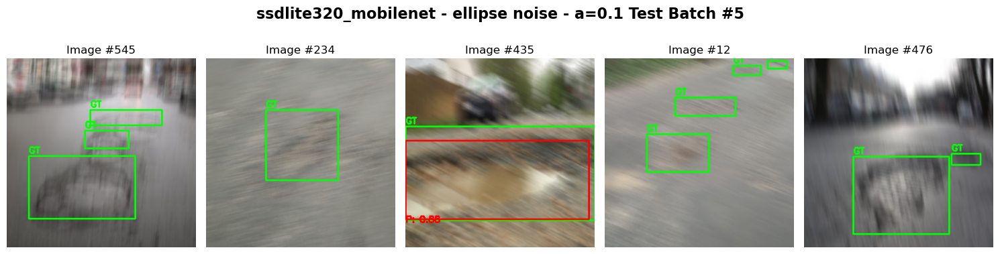

Mean Average Precision @ 0.5 : 0.2766 FPS: 435.66


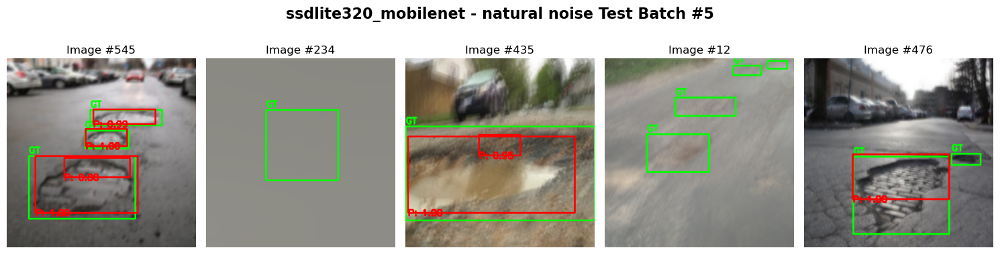

In [4]:
model_name = "ssdlite320_mobilenet_v3_large"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("../data/models/ssdlite320_mobilenet_v3_large/ssdlite320_mobilenet_v3_large_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="ssdlite320_mobilenet - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="ssdlite320_mobilenet - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="ssdlite320_mobilenet - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="ssdlite320_mobilenet - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="ssdlite320_mobilenet - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="ssdlite320_mobilenet - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="ssdlite320_mobilenet - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="ssdlite320_mobilenet - natural noise")


In [5]:
# save history to .json file
utils.update_json(history, model_name="ssdlite320_mobilenet", save_path='../')

In [6]:
# Train with data augmentation
history = trainer.train_from_config(model_config_path="../data/models/ssdlite320_mobilenet_v3_large/ssdlite320_mobilenet_v3_large_best_params.json", train_set=train_set, val_set=val_set, save_path="../data/models/ssdlite320_mobilenet_v3_large/", kornia_aug=True)

Starting training for ssdlite320_mobilenet_v3_large with the following parameters:
{'batch_size': 8, 'epochs': 100, 'preweight_mode': 'fine_tuning', 'optimizer': 'Adam', 'lr': 0.000721282926313481, 'beta1': 0.9073359186756311, 'beta2': 0.9910589483762591, 'scheduler': 'CosineAnnealingLR', 'T_max': 6, 'eta_min': 1.4508027487967911e-06}
Epoch 1/100, Train Loss: 240.5229, Val mAP@50: 0.3394, FPS: 564.09, Epoch Time: 4.77 seconds
Epoch 2/100, Train Loss: 175.2782, Val mAP@50: 0.4199, FPS: 575.90, Epoch Time: 4.77 seconds
Epoch 3/100, Train Loss: 153.4037, Val mAP@50: 0.4262, FPS: 587.80, Epoch Time: 4.75 seconds
Epoch 4/100, Train Loss: 133.9154, Val mAP@50: 0.4028, FPS: 579.01, Epoch Time: 4.67 seconds
Epoch 5/100, Train Loss: 119.6779, Val mAP@50: 0.4375, FPS: 581.38, Epoch Time: 4.70 seconds
Epoch 6/100, Train Loss: 111.1116, Val mAP@50: 0.4378, FPS: 585.47, Epoch Time: 4.71 seconds
Epoch 7/100, Train Loss: 111.0814, Val mAP@50: 0.4379, FPS: 573.70, Epoch Time: 4.82 seconds
Epoch 8/100,

Mean Average Precision @ 0.5 : 0.4023 FPS: 443.05


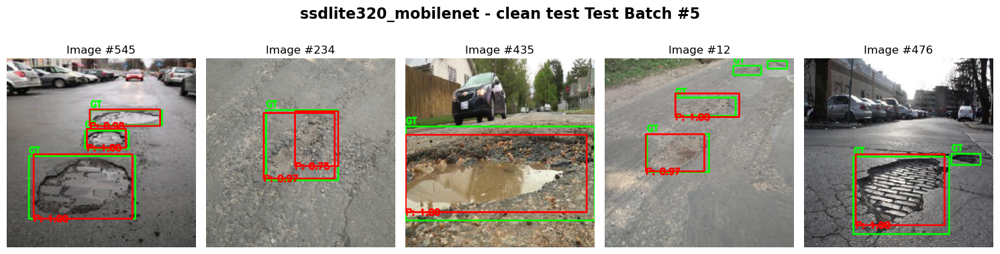

Mean Average Precision @ 0.5 : 0.3791 FPS: 468.67


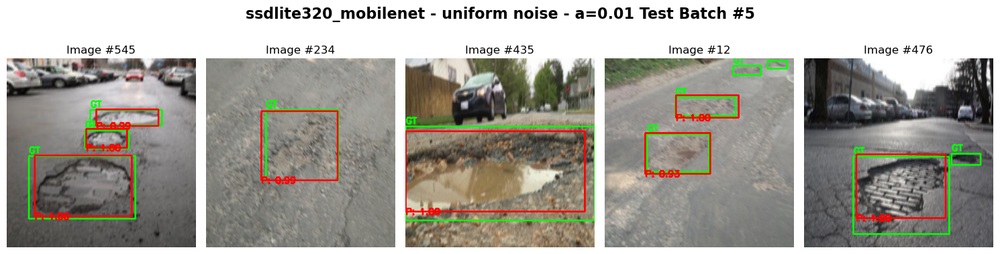

Mean Average Precision @ 0.5 : 0.3587 FPS: 468.74


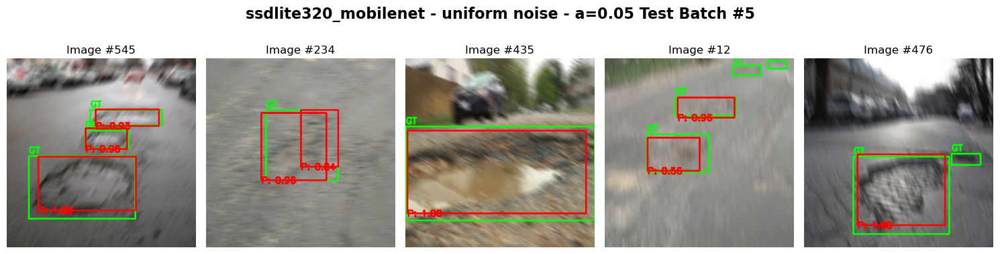

Mean Average Precision @ 0.5 : 0.2914 FPS: 462.59


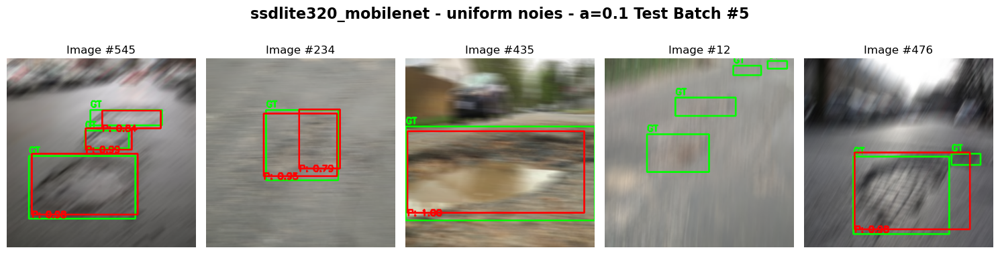

Mean Average Precision @ 0.5 : 0.3779 FPS: 468.81


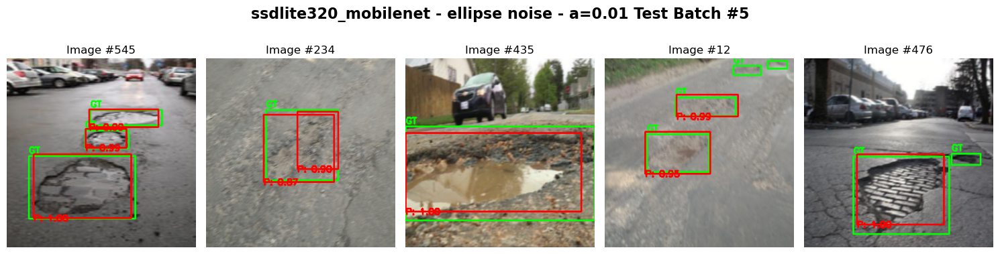

Mean Average Precision @ 0.5 : 0.3513 FPS: 470.29


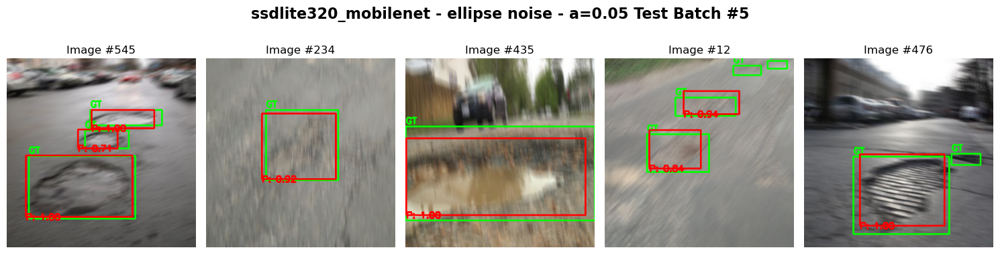

Mean Average Precision @ 0.5 : 0.2621 FPS: 469.42


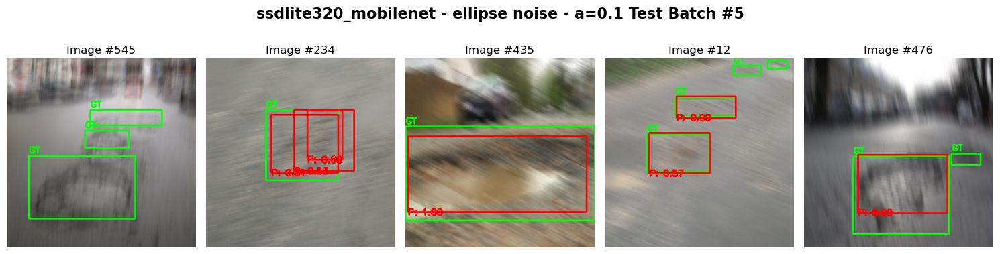

Mean Average Precision @ 0.5 : 0.3602 FPS: 463.17


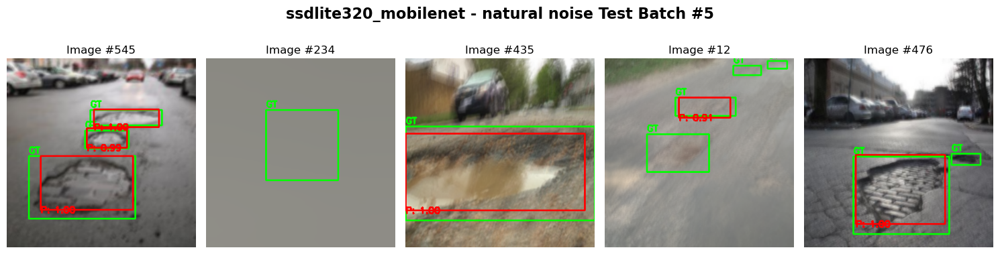

In [7]:
model_name = "ssdlite320_mobilenet_v3_large"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("../data/models/ssdlite320_mobilenet_v3_large/ssdlite320_mobilenet_v3_large_aug_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="ssdlite320_mobilenet - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="ssdlite320_mobilenet - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="ssdlite320_mobilenet - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="ssdlite320_mobilenet - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="ssdlite320_mobilenet - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="ssdlite320_mobilenet - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="ssdlite320_mobilenet - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="ssdlite320_mobilenet - natural noise")

In [8]:
# save history to .json file
utils.update_json(history, model_name="ssdlite320_mobilenet_aug", save_path='../')